In [1]:
function naive_multiplication(A, B)
    C = zeros(Float64, size(A, 1), size(B, 2))
    for i=1:size(A, 1)
        for j=1:size(B, 2)
            for k=1:size(A, 2)
                C[i,j]=C[i, j] + A[i, k] * B[k, j] 
            end
        end
    end
    C
end

naive_multiplication (generic function with 1 method)

In [2]:
function better_multiplication( A,B )
    C=zeros(Float64,size(A,1),size(B,2))
      for j=1:size(B,2)
        for k=1:size(A,2)
            for i=1:size(A,1)
                C[i,j]=C[i,j]+A[i,k]*B[k,j]
            end
        end
    end
    C
end

better_multiplication (generic function with 1 method)

In [3]:
using Plots

x_axis=100:100:1000
y_axis = []
y_axis1 = []
y_axis2 = []

# ! - modyfikacja argumentów (jak pointer w C)
for x in x_axis
    append!(y_axis, @elapsed naive_multiplication(rand(x, x), rand(x, x)))
    append!(y_axis1, @elapsed better_multiplication(rand(x, x), rand(x, x)))
    append!(y_axis2, @elapsed rand(x, x)*rand(x, x))
end

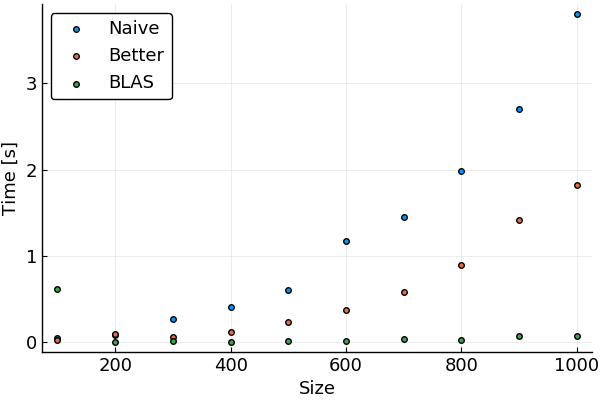

/usr/local/lib/python2.7/dist-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family [u'cursive'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


In [4]:
#Z czcionką sobie poradziłem, ale rozmiaru punktów już nie byłem w stanie zmienić
pyplot()
f=font(13,"cursive")
scatter(x_axis, [y_axis, y_axis1, y_axis2], 
    labels =["Naive" "Better" "BLAS"], 
    xlabel = "Size", 
    ylabel = "Time [s]", 
    titlefont=f, 
    tickfont=f, 
    legendfont=f, 
    guidefont=f)

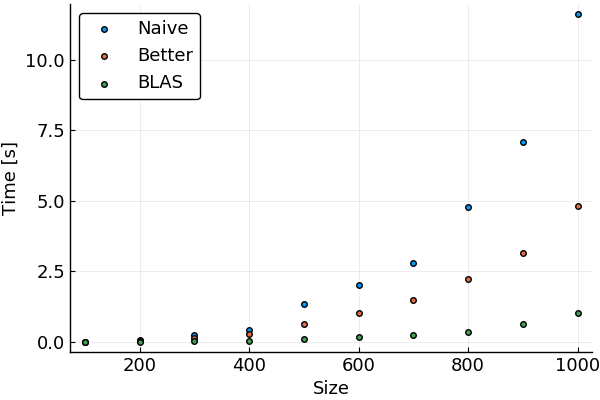

In [12]:
using CSV
using Plots
using DataFrames

data = CSV.read("result.csv")

scatter(data[:Size], [data[:Naive], data[:Better], data[:BLAS]], 
    labels =["Naive" "Better" "BLAS"], 
    xlabel = "Size", 
    ylabel = "Time [s]",
    titlefont=f, 
    tickfont=f, 
    legendfont=f, 
    guidefont=f)

In [5]:
using Polynomials

fit_y = polyfit(x_axis, y_axis, 3)

Poly(-0.1229366264000014 + 0.0014571145556915395*x - 1.918533718414934e-6*x^2 + 4.331962398212906e-9*x^3)

In [6]:
fit_y1 = polyfit(x_axis, y_axis1, 3)

Poly(0.051396969400000284 - 1.5845186822070043e-5*x - 4.305945508158431e-7*x^2 + 2.2569160225330174e-9*x^3)

In [7]:
fit_y2 = polyfit(x_axis, y_axis2, 2)

Poly(0.5634944022833338 - 0.001939100781083334*x + 1.5293019488636358e-6*x^2)

In [13]:
#Jak nie będzie się chciało odpalić to ponownie wykonać blok In[12]
fit_y_C = polyfit(x_axis, data[:Naive], 3)

Poly(-0.9425856333333325 + 0.010051869271561757*x - 2.691151660839157e-5*x^2 + 2.9151421911421883e-8*x^3)

In [14]:
fit_y1_C = polyfit(x_axis, data[:Better], 3)

Poly(-0.2572901000000013 + 0.0026492523251748323*x - 6.409942773892786e-6*x^2 + 8.751870046620051e-9*x^3)

In [15]:
fit_y2_C = polyfit(x_axis, data[:BLAS], 2)

Poly(0.1447457999999996 - 0.001099283696969695*x + 1.8792787878787856e-6*x^2)

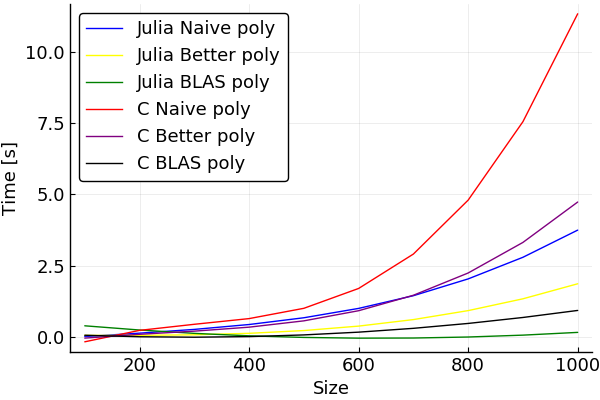

In [24]:
f=font(13,"cursive")
Plots.plot(x_axis, [polyval(fit_y, x_axis), 
        polyval(fit_y1, x_axis), 
        polyval(fit_y2, x_axis),
        polyval(fit_y_C, x_axis),
        polyval(fit_y1_C, x_axis),
        polyval(fit_y2_C, x_axis)],
    labels = ["Julia Naive poly" "Julia Better poly" "Julia BLAS poly" "C Naive poly" "C Better poly" "C BLAS poly"],
    colour = [:blue :yellow :green :red :purple :black],    
    xlabel = "Size",
    ylabel = "Time [s]",
    titlefont=f, 
    tickfont=f, 
    legendfont=f, 
    guidefont=f)

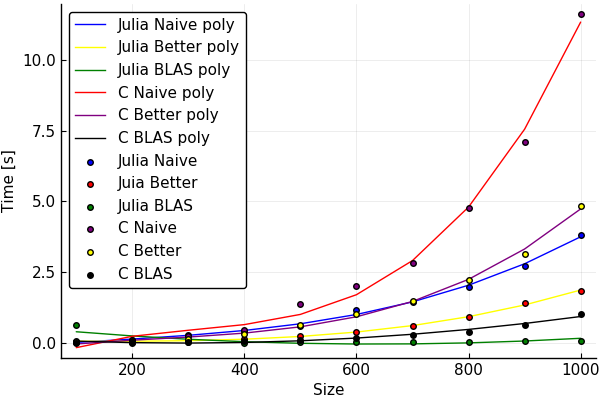

In [25]:
f=font(11,"cursive")
scatter!(x_axis, [y_axis, y_axis1, y_axis2], 
        labels =["Julia Naive" "Juia Better" "Julia BLAS"],
        colour = [:blue :red :green], 
        titlefont=f, 
        tickfont=f, 
        legendfont=f, 
        guidefont=f)


scatter!(data[:Size], [data[:Naive], data[:Better], data[:BLAS]], 
    labels =["C Naive" "C Better" "C BLAS"],
    colour = [:purple :yellow :black], 
    titlefont=f, 
    tickfont=f, 
    legendfont=f, 
    guidefont=f)


In [26]:
#Ostatecznie wychodzi, że Julia jest szybsza od C, nawet dla dużych rozmiarów macierzy
#Julia Naive wyprzedza C Better, co jest zaskakujące.